# FedEx AOD - Data Visualization 

## ◈ Data Preparation ◈

In [190]:
# Importing required libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import matplotlib.colors as mcolors
import seaborn as sns
from wordcloud import WordCloud
from wordcloud import ImageColorGenerator
from wordcloud import STOPWORDS
from statsmodels.graphics.mosaicplot import mosaic
import warnings
warnings.filterwarnings('ignore') # Just to ignore future package release notes

In [191]:
# Loading in the data where each sheet is a different dataframe

xls = pd.ExcelFile("visualization_sample_set_interview_practical.xlsx")
df1 = pd.read_excel(xls, "Source")
df2 = pd.read_excel(xls, "Impl")
df3 = pd.read_excel(xls, "Monitoring")

In [192]:
# Inspecting the data

display(df1.head())
df1.info()

df2 = df2.drop('SN', 1) #  dropping first column, unnecessary index
display(df2.head())
df2.info()

df3 = df3.drop('SN', 1) # dropping first column, unnecessary index
display(df3.head())
df3.info()

## We observe that in the first sheet, almost half of the value in the 'Submitted By' and 'Plan ID' column are
## missing. Similarly in the second sheet many values for 'Channels', 'End Date', 'Responsible 1', 'Mitigation Type'
## are missing, and almost all values for 'Responsible 2' are missing. Sheet 3 has a lot of missing values for
## 'Lower Limit Value', 'Upper Limit Value', and 'Start Date', with almost all values for 'Stop Date', 'Observed Value' 
## and 'Observed Date' missing.

,Name,Created,Modified,Submitted By,Plan ID,CurrentStatus
0,SRA 2021-AAIP-188 RII Missing -82,2021-02-18,2021-03-01,Dan Land,0,Interview Complete
1,OAK 777 Parking Procedures SRA,2019-08-27,2019-08-27,David Frassinelli,159,Needs Interview
2,OAK 777 Parking Procedures SRA,2019-08-27,2019-08-27,David Frassinelli,160,Needs Interview
3,Go Around SRA Final,2020-10-30,2020-12-24,Gary Murphy,171,Interview Complete
4,2020-AAIP-4529 4.2.1 (31) Pitot Covers Install...,2020-12-23,2021-03-01,James (Jim) Chandler,172,Interview Complete


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 426 entries, 0 to 425
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Name           426 non-null    object        
 1   Created        426 non-null    datetime64[ns]
 2   Modified       426 non-null    datetime64[ns]
 3   Submitted By   223 non-null    object        
 4   Plan ID        233 non-null    object        
 5   CurrentStatus  426 non-null    object        
dtypes: datetime64[ns](2), object(4)
memory usage: 20.1+ KB


,Plan ID,Source Type,Channels,Status,End Date,Created By,Responsible 1,Responsible 2,Mitigation Type
0,2,VDR,NaN,Pending Implementation,2021-02-01T06:00:00.000Z,Randy Brinsfield,Randy Brinsfield,NaN,NaN
1,3,VDR,NaN,Canceled,2020-11-03T06:00:00.000Z,Donald Eddins,Daniel Land,NaN,NaN
2,4,VDR,NaN,Pending Implementation,2020-12-15T06:00:00.000Z,Hans Kurtzman,Hans Kurtzman,NaN,mitigation type 1
3,5,VDR,NaN,Pending Implementation,2020-12-24T05:00:00.000Z,Michael Dooley,Andrew Halliburton,NaN,mitigation type 1
4,6,VDR,NaN,Closed,2020-12-09T06:00:00.000Z,Donald Eddins,Donald Eddins,NaN,NaN


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 404 entries, 0 to 403
Data columns (total 9 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Plan ID          404 non-null    int64 
 1   Source Type      404 non-null    object
 2   Channels         251 non-null    object
 3   Status           404 non-null    object
 4   End Date         269 non-null    object
 5   Created By       404 non-null    object
 6   Responsible 1    268 non-null    object
 7   Responsible 2    3 non-null      object
 8   Mitigation Type  156 non-null    object
dtypes: int64(1), object(8)
memory usage: 28.5+ KB


,Plan ID,Channels,Status,Interval,Lower Limit Value,Upper Limit Value,Limit Unit,Start Date,Stop Date,Observed Value,Observed Date
0,142,Maint Action,Pending Monitoring,Monthly,1.0,4.0,Period,NaN,NaN,NaN,NaN
1,159,Audits Channel,Pending Monitoring,Monthly,NaN,1.0,Cycle,NaN,NaN,NaN,NaN
2,160,Audits Channel,Pending Monitoring,Monthly,NaN,1.0,Event,NaN,NaN,NaN,NaN
3,173,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,172,Audits Channel,Pending Monitoring,Monthly,NaN,50.0,Per Event,NaN,NaN,NaN,NaN


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 391 entries, 0 to 390
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Plan ID            391 non-null    int64  
 1   Channels           387 non-null    object 
 2   Status             387 non-null    object 
 3   Interval           387 non-null    object 
 4   Lower Limit Value  102 non-null    float64
 5   Upper Limit Value  224 non-null    float64
 6   Limit Unit         372 non-null    object 
 7   Start Date         277 non-null    object 
 8   Stop Date          65 non-null     object 
 9   Observed Value     3 non-null      float64
 10  Observed Date      6 non-null      object 
dtypes: float64(3), int64(1), object(7)
memory usage: 33.7+ KB


## ➢ Visualizing First Sheet/Dataset

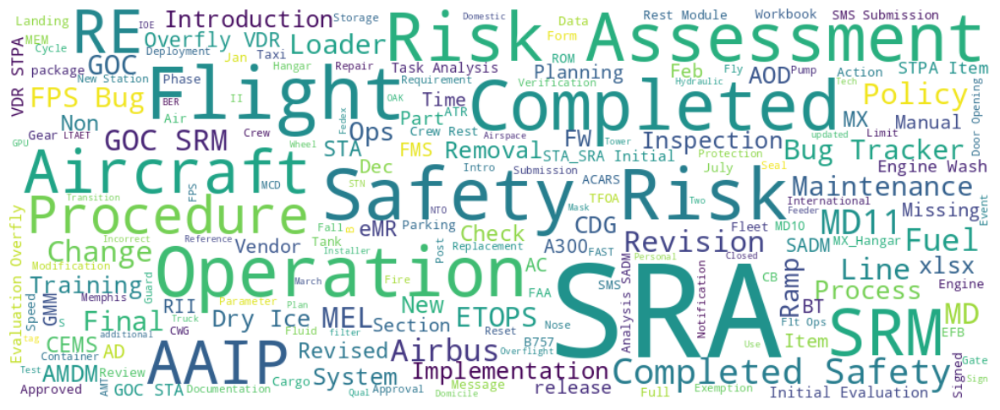

In [193]:
random.seed(4825)

## Word-cloud based on report name to get a sense of the theme of reports
df1['Name'] = df1['Name'].astype('str')
text = " ".join(i for i in df1.Name)
stopwords = set(STOPWORDS)
wordcloud = WordCloud(stopwords=stopwords, background_color="white", width=1000, height=400).generate(text)
plt.figure( figsize=(15,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

96


<AxesSubplot: >

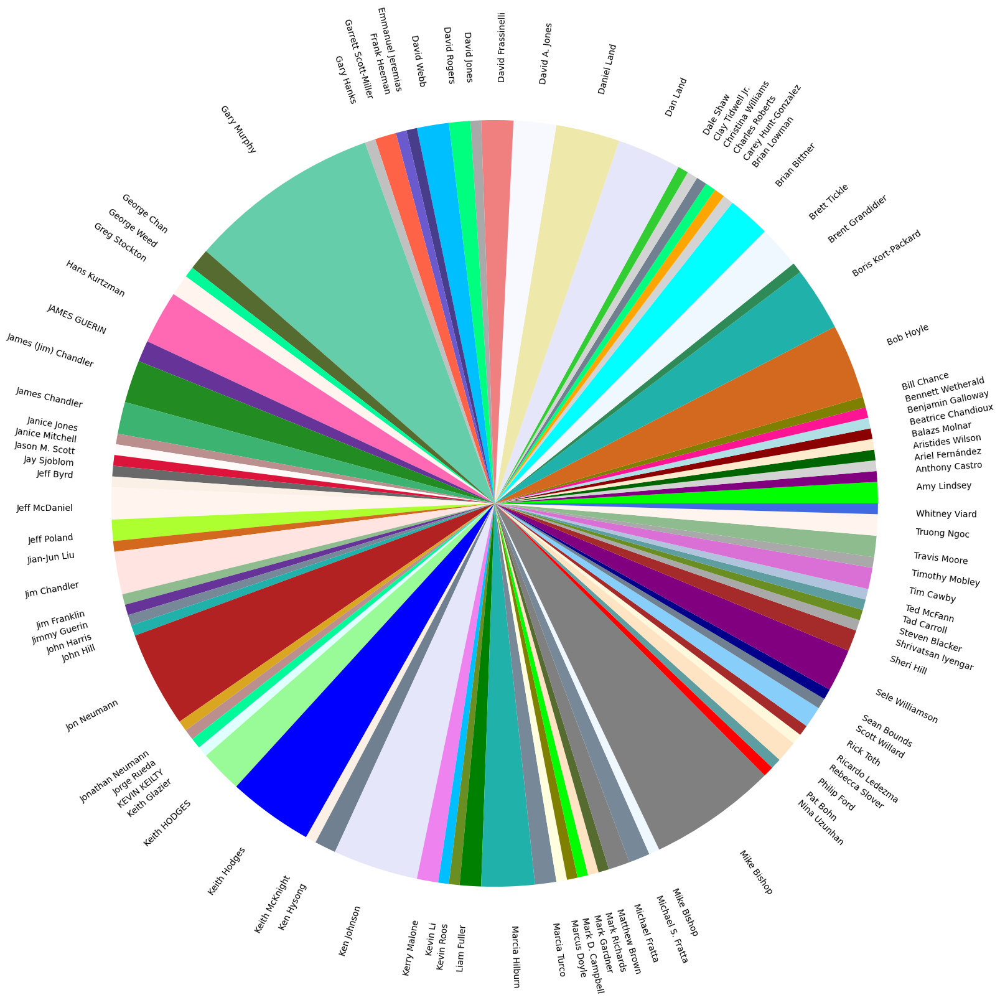

In [194]:
## Pie chart of unique report submitters

df = df1.groupby(['Submitted By']).size()
print(len(df)) # 96 unique value, which means that all the reports came from only 96 sources 
colors = random.choices(list(mcolors.CSS4_COLORS.values()),k = 96)
df.plot.pie(y='Submitted By', figsize=(20, 20), rotatelabels=True, colors=colors)

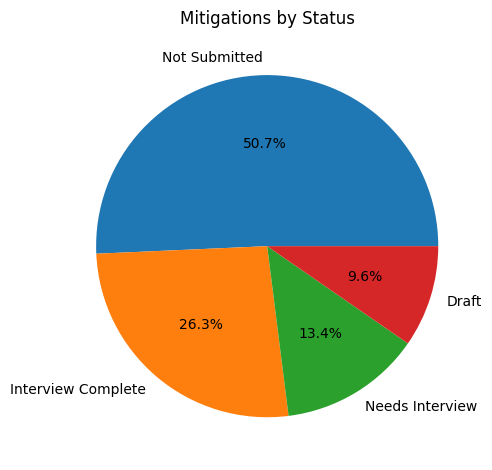

In [195]:
## Distribution of mitigations by their current status

current_status_counts = pd.DataFrame(df1['CurrentStatus'].value_counts().reset_index()) # Creating separate df for plotting
plt.pie(data=current_status_counts, x='CurrentStatus', labels='index', autopct='%.1f%%')
plt.title('Mitigations by Status')
plt.tight_layout()
 
# We notice that the majority of mitigation reports are not submitted

In [196]:
## Creating year-partitioned datasets for first sheet for use later
df1['Created'] = pd.to_datetime(df1['Created'], format='%Y-%m-%d')
df1['Modified'] = pd.to_datetime(df1['Modified'], format='%Y-%m-%d')
df1_2019 = df1.loc[(df1['Created'] >= '2019-01-01') & (df1['Created'] <= '2019-12-31')]
df1_2020 = df1.loc[(df1['Created'] >= '2020-01-01') & (df1['Created'] <= '2020-12-31')]
df1_2021 = df1.loc[(df1['Created'] >= '2021-01-01') & (df1['Created'] <= '2021-12-31')]

Text(0, 0.5, 'Frequency')

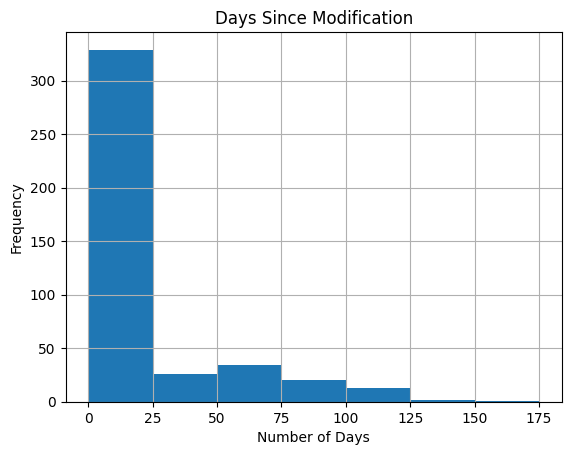

In [197]:
## Days since modification histogram
df1['Created'] = pd.to_datetime(df1['Created'], format='%Y-%m-%d')
df1['days_modified'] = df1['Modified'] - df1['Created'] # New feature - days passed between report creation and modification
df1['days_modified'].describe() # On average, reports were modified in 17 days, earliest modification occured on the same 
# day, latest modification occured 182 days later
df1['days_modified'].dt.days.hist(bins=range(0, 182, 25))
plt.title('Days Since Modification')
plt.xlabel('Number of Days')
plt.ylabel('Frequency')

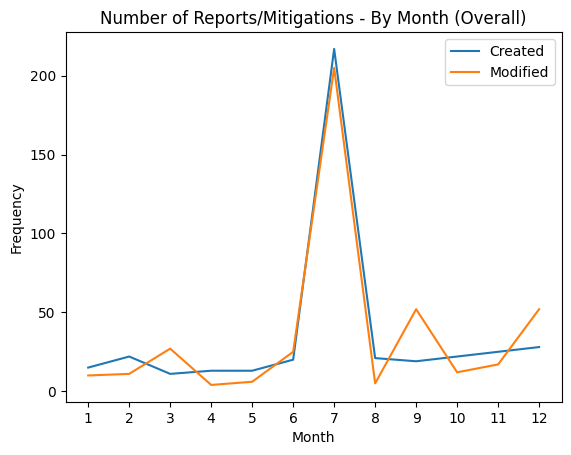

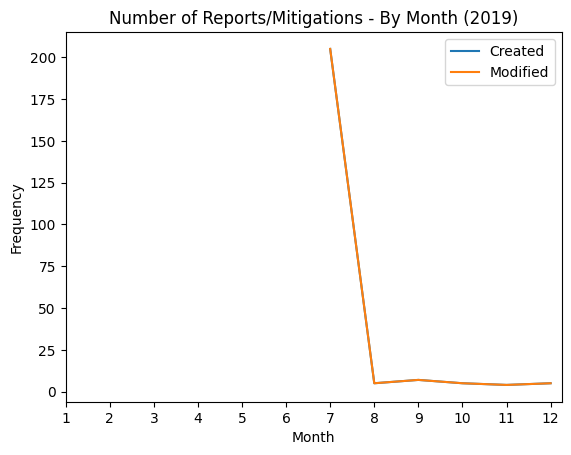

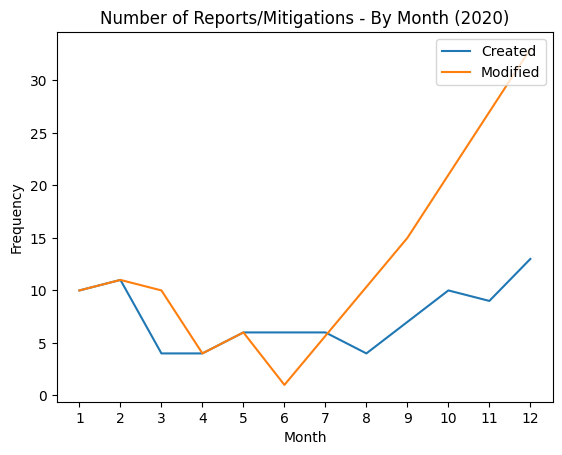

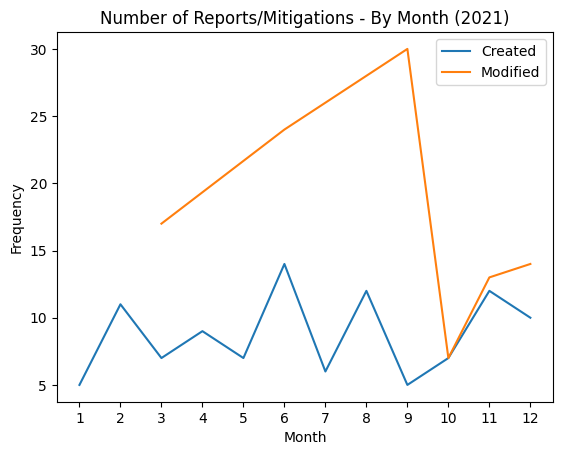

In [198]:
## Report creations and modifications by month (sorted by year)
# Overall for full dataset
df1['Created'].dt.month.value_counts().sort_index().plot(use_index=True, label="Created") # Spike in creations in the month of July
df1['Modified'].dt.month.value_counts().sort_index().plot(use_index=True, label="Modified") # Spike in modifications in the month of July??
plt.xticks(range(1, 13))
plt.title('Number of Reports/Mitigations - By Month (Overall)')
plt.xlabel('Month')
plt.ylabel('Frequency')
plt.legend(loc="upper right")
plt.show()

# For 2019
df1_2019['Created'].dt.month.value_counts().sort_index().plot(use_index=True, label="Created") # Spike in creations in the month of July
df1_2019['Modified'].dt.month.value_counts().sort_index().plot(use_index=True, label="Modified") # Spike in modifications in the month of July??
plt.xticks(range(1, 13))
plt.title('Number of Reports/Mitigations - By Month (2019)')
plt.xlabel('Month')
plt.ylabel('Frequency')
plt.legend(loc="upper right")
plt.show()

# For 2020
df1_2020['Created'].dt.month.value_counts().sort_index().plot(use_index=True, label="Created") # Spike in creations in the month of July
df1_2020['Modified'].dt.month.value_counts().sort_index().plot(use_index=True, label="Modified") # Spike in modifications in the month of July??
plt.xticks(range(1, 13))
plt.title('Number of Reports/Mitigations - By Month (2020)')
plt.xlabel('Month')
plt.ylabel('Frequency')
plt.legend(loc="upper right")
plt.show()

# For 2021
df1_2021['Created'].dt.month.value_counts().sort_index().plot(use_index=True, label="Created") # Spike in creations in the month of July
df1_2021['Modified'].dt.month.value_counts().sort_index().plot(use_index=True, label="Modified") # Spike in modifications in the month of July??
plt.xticks(range(1, 13))
plt.title('Number of Reports/Mitigations - By Month (2021)')
plt.xlabel('Month')
plt.ylabel('Frequency')
plt.legend(loc="upper right")
plt.show()

# There is a difference in report/mitigation creation between 2020 and 2021, as the year progresses

[Text(0.5, 820.8055555555555, 'Week'), Text(158.22222222222223, 0.5, 'Day')]

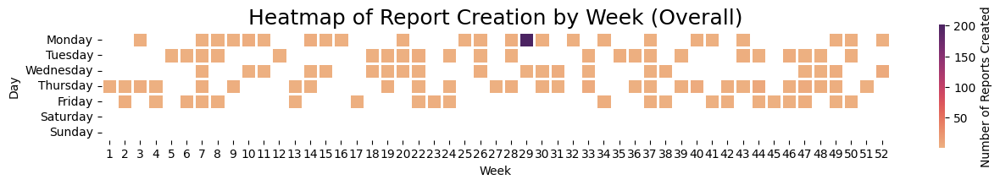

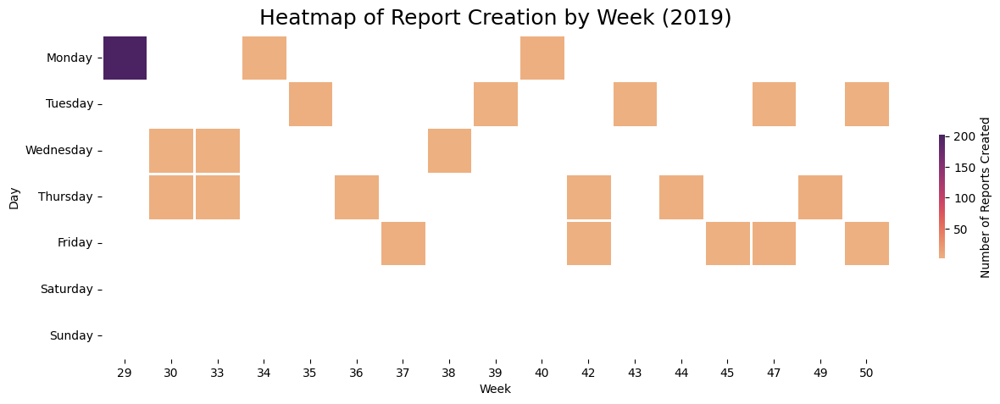

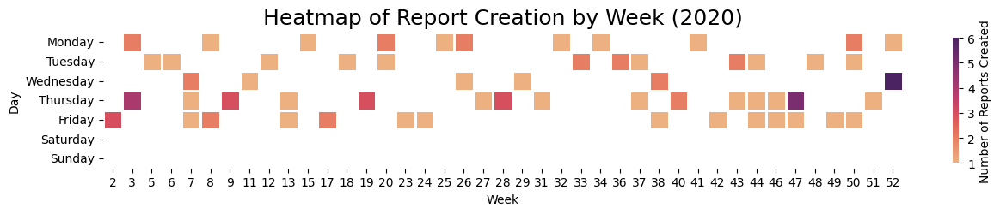

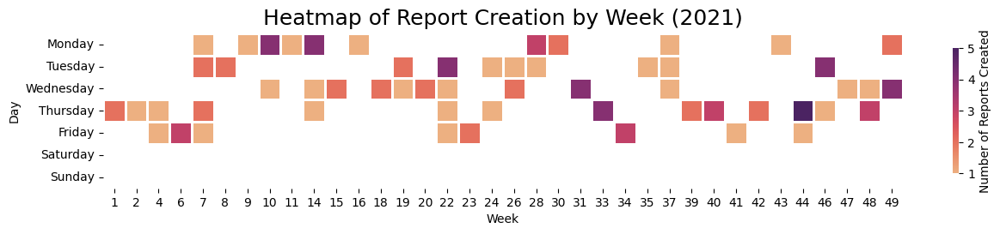

In [199]:
## Heatmap to see which days were the most active for reporting (To visually ascertain pattern for report creation
## over days, which days are busier?)

# Overall for full dataset
days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
df1['creation_time_week'] = df1['Created'].dt.isocalendar().week
df1['creation_time_day_name'] = df1['Created'].dt.day_name()

df1_hm = pd.pivot_table(df1[['creation_time_week', 'creation_time_day_name']], 
                              index=['creation_time_week', 'creation_time_day_name'], aggfunc='size')
df1_hm = df1_hm.unstack(level=1)
df1_hm = df1_hm.reindex(columns=days)
df1_hm = df1_hm.T

f, ax = plt.subplots(figsize=(15, 19))
ax = sns.heatmap(df1_hm, square=True, cmap='flare', linewidths=.9, ax=ax,
                cbar_kws={"shrink":.1, "label": "Number of Reports Created"})
ax.axes.set_title("Heatmap of Report Creation by Week (Overall)", fontsize=18, y=1.01)
ax.set(xlabel='Week', ylabel='Day')

# For 2019
df1_2019['creation_time_week'] = df1_2019['Created'].dt.isocalendar().week
df1_2019['creation_time_day_name'] = df1_2019['Created'].dt.day_name()

df1_hm = pd.pivot_table(df1_2019[['creation_time_week', 'creation_time_day_name']], 
                              index=['creation_time_week', 'creation_time_day_name'], aggfunc='size')
df1_hm = df1_hm.unstack(level=1)
df1_hm = df1_hm.reindex(columns=days)
df1_hm = df1_hm.T

f, ax = plt.subplots(figsize=(15, 19))
ax = sns.heatmap(df1_hm, square=True, cmap='flare', linewidths=.9, ax=ax,
                cbar_kws={"shrink":.1, "label": "Number of Reports Created"})
ax.axes.set_title("Heatmap of Report Creation by Week (2019)", fontsize=18, y=1.01)
ax.set(xlabel='Week', ylabel='Day')

# For 2020
df1_2020['creation_time_week'] = df1_2020['Created'].dt.isocalendar().week
df1_2020['creation_time_day_name'] = df1_2020['Created'].dt.day_name()

df1_hm = pd.pivot_table(df1_2020[['creation_time_week', 'creation_time_day_name']], 
                              index=['creation_time_week', 'creation_time_day_name'], aggfunc='size')
df1_hm = df1_hm.unstack(level=1)
df1_hm = df1_hm.reindex(columns=days)
df1_hm = df1_hm.T

f, ax = plt.subplots(figsize=(15, 19))
ax = sns.heatmap(df1_hm, square=True, cmap='flare', linewidths=.9, ax=ax,
                cbar_kws={"shrink":.1, "label": "Number of Reports Created"})
ax.axes.set_title("Heatmap of Report Creation by Week (2020)", fontsize=18, y=1.01)
ax.set(xlabel='Week', ylabel='Day')

# For 2021
df1_2021['creation_time_week'] = df1_2021['Created'].dt.isocalendar().week
df1_2021['creation_time_day_name'] = df1_2021['Created'].dt.day_name()

df1_hm = pd.pivot_table(df1_2021[['creation_time_week', 'creation_time_day_name']], 
                              index=['creation_time_week', 'creation_time_day_name'], aggfunc='size')
df1_hm = df1_hm.unstack(level=1)
df1_hm = df1_hm.reindex(columns=days)
df1_hm = df1_hm.T

f, ax = plt.subplots(figsize=(15, 19))
ax = sns.heatmap(df1_hm, square=True, cmap='flare', linewidths=.9, ax=ax,
                cbar_kws={"shrink":.1, "label": "Number of Reports Created"})
ax.axes.set_title("Heatmap of Report Creation by Week (2021)", fontsize=18, y=1.01)
ax.set(xlabel='Week', ylabel='Day')

## ➢ Visualizing Second Sheet/Dataset 

103


<AxesSubplot: >

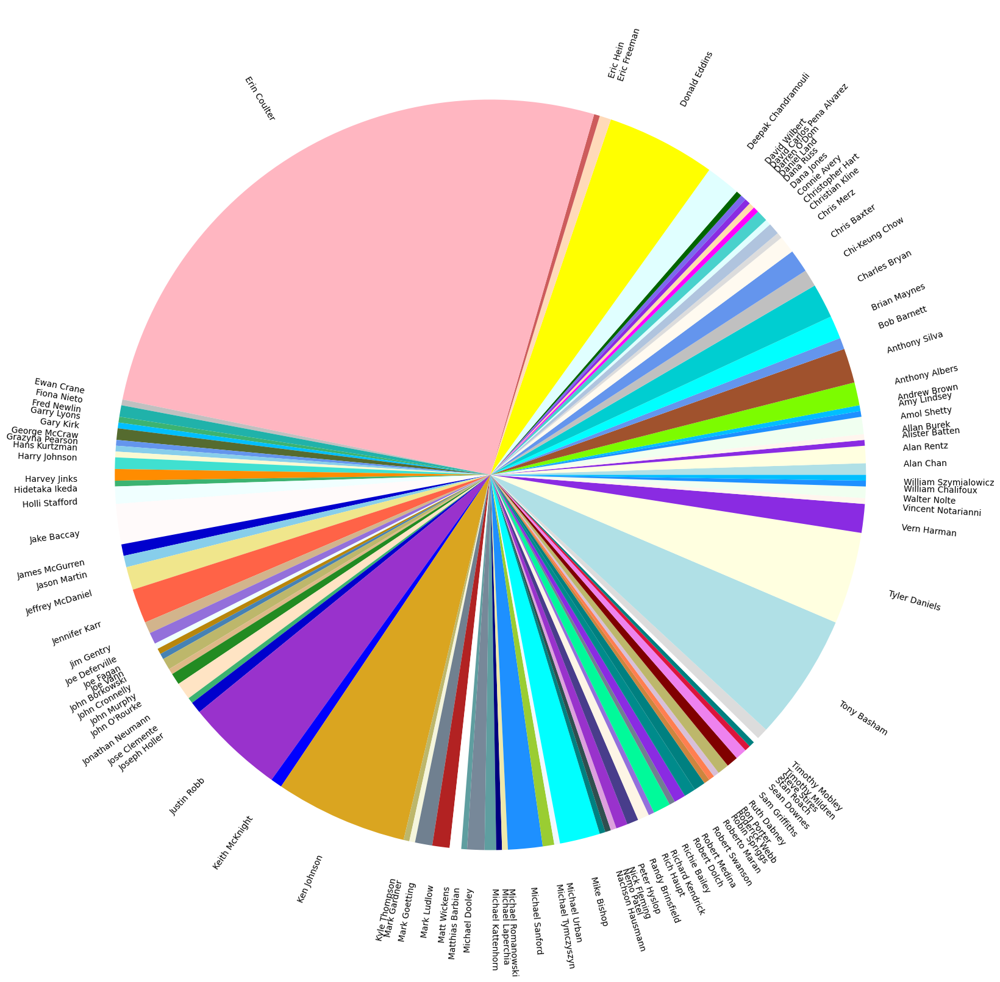

In [200]:
## Pie chart of unique report submitters
df = df2.groupby(['Created By']).size()
print(len(df)) # 103 unique value, which means that all the reports came from only 103 sources, of which Erin Coulter
# has created most tracking reports
colors = random.choices(list(mcolors.CSS4_COLORS.values()),k = 96)
df.plot.pie(y='Submitted By', figsize=(20, 20), rotatelabels=True, colors=colors)

,index,Source Type
0,VDR,232
1,SRA,151
2,MTS,21


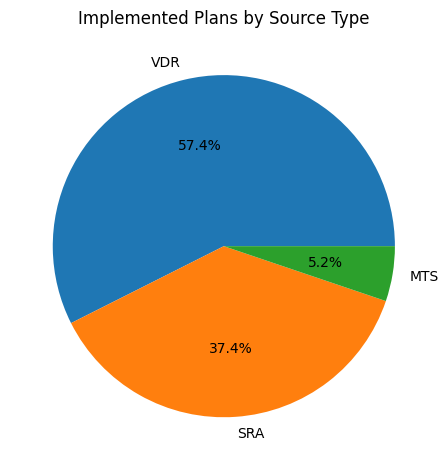

In [201]:
# Checking distribution of Source Type for implemented plans

##
source_type_counts = pd.DataFrame(df2['Source Type'].value_counts().reset_index()) # Creating separate df for plotting
display(source_type_counts)
plt.pie(data=source_type_counts, x='Source Type', labels='index', autopct='%.1f%%')
plt.title('Implemented Plans by Source Type')
plt.tight_layout()

# We can see that the majority of implemented plans have VDR as a source, followed by SRA as the second biggest source,
# and finally, MTS as the source for the remaining plans

,index,Mitigation Type
0,Train and Educate,51
1,mitigation type 1,40
2,Communicate / Warn,28
3,Improved Task Design,15
4,Engineer,7
5,Limit Exposure,6
6,Guard,3
7,Selection of Personnel,2
8,Train & Educate,2
9,Communicate/Warn,1


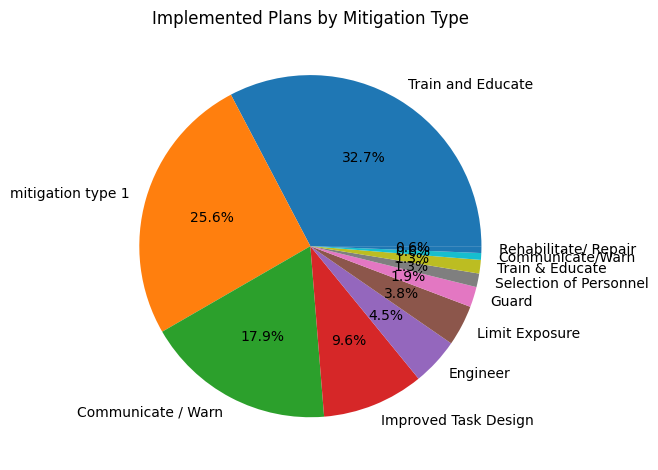

,index,Mitigation Type
0,Unknown,248
1,Train and Educate,51
2,mitigation type 1,40
3,Communicate / Warn,28
4,Improved Task Design,15
5,Engineer,7
6,Limit Exposure,6
7,Guard,3
8,Selection of Personnel,2
9,Train & Educate,2


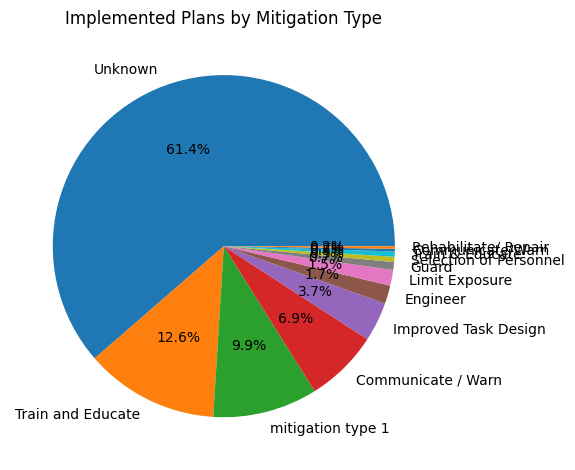

,index,Mitigation Type
0,Train and Educate,299
1,mitigation type 1,40
2,Communicate / Warn,28
3,Improved Task Design,15
4,Engineer,7
5,Limit Exposure,6
6,Guard,3
7,Selection of Personnel,2
8,Train & Educate,2
9,Communicate/Warn,1


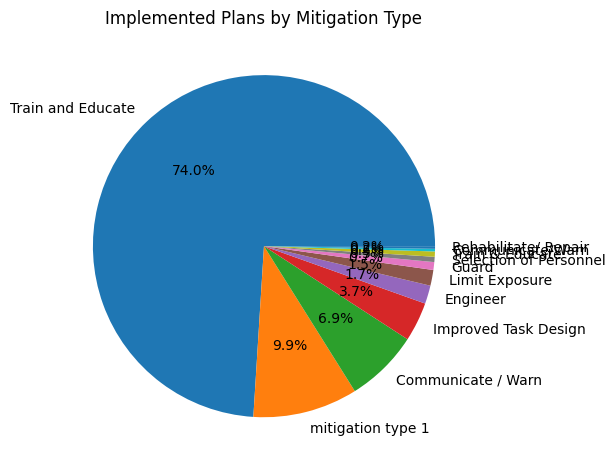

In [202]:
## Distribution of mitigations by Mitigation Type

mitigation_type_counts = pd.DataFrame(df2['Mitigation Type'].value_counts().reset_index()) # Creating separate df for plotting
display(mitigation_type_counts)
plt.pie(data=mitigation_type_counts, x='Mitigation Type', labels='index', autopct='%.1f%%')
plt.title('Implemented Plans by Mitigation Type')
plt.tight_layout()
plt.show()

# Majority (not absolute) of mitigation plan types are 'Train and Educate', followed by 'mitigation type 1', and 
# 'Communicate / Warn' at third place. Only one mitigation plan type involves rehabilitation and repair but we have
# to keep in mind that we only have 156 observations for mitigation type of the 404 entries in the dataset, but we 
# can use these proportions to estimate the others.

# We can impute the missing values with 'Unknown'
df2['Mitigation Type'] = df2['Mitigation Type'].astype(object)
df2['Mitigation Type'].fillna('Unknown', inplace=True)

mitigation_type_counts = pd.DataFrame(df2['Mitigation Type'].value_counts().reset_index()) # Creating separate df for plotting
display(mitigation_type_counts)
plt.pie(data=mitigation_type_counts, x='Mitigation Type', labels='index', autopct='%.1f%%')
plt.title('Implemented Plans by Mitigation Type')
plt.tight_layout()
plt.show()
# Now the vast majority of the mitigations are of an unknown type

# Filling in missing values with most commonly occuring category (mode)
df2 = pd.read_excel(xls, "Impl")
df2 = df2.apply(lambda x: x.fillna(x.value_counts().index[0]))

mitigation_type_counts = pd.DataFrame(df2['Mitigation Type'].value_counts().reset_index()) # Creating separate df for plotting
display(mitigation_type_counts)
plt.pie(data=mitigation_type_counts, x='Mitigation Type', labels='index', autopct='%.1f%%')
plt.title('Implemented Plans by Mitigation Type')
plt.tight_layout()
plt.show()
# Now the vast majority of the mitigations are 'Train and Educate'

,index,Status
0,Pending Implementation,162
1,Monitoring,140
2,Closed,39
3,Pending Monitoring,25
4,Implementation Complete,24
5,Canceled,13
6,Fail,1


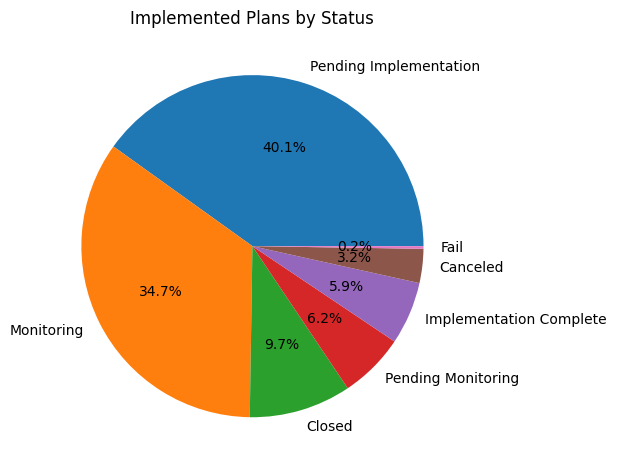

In [203]:
## Distribution of mitigations by Status
df2 = pd.read_excel(xls, "Impl") # Re-loading data to reset previous missin-value imputation

status_counts = pd.DataFrame(df2['Status'].value_counts().reset_index()) # Creating separate df for plotting
display(status_counts)
plt.pie(data=status_counts, x='Status', labels='index', autopct='%.1f%%')
plt.title('Implemented Plans by Status')
plt.tight_layout()
plt.show()

# Looks like most implementation plans are pending implementation, followed in frequency by current plans being 
# monitored

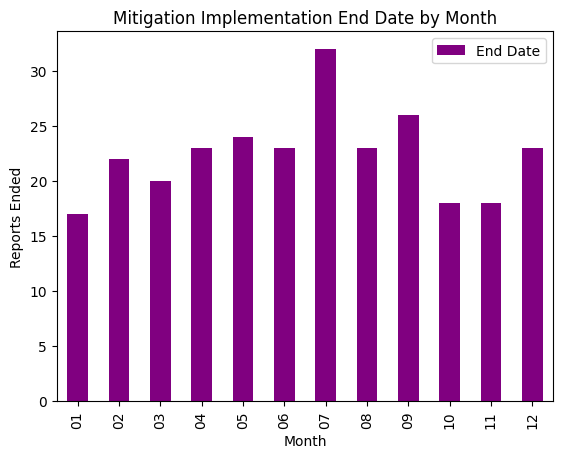

In [204]:
# Bar chart to get a sense of end-dates


df2['End Date'] = pd.to_datetime(df2['End Date'], format='%Y-%m-%d')
df2_ed_months = pd.DataFrame(df2['End Date'].dt.strftime('%m').value_counts().sort_index())

df2_ed_months.plot(kind='bar', color='purple')
plt.title('Mitigation Implementation End Date by Month')
plt.xlabel('Month')
plt.ylabel('Reports Ended')
plt.legend(loc="upper right")
plt.show()

# Most mitigations were ended, by amount, in July, but seem pretty even across the year

<class 'pandas.core.frame.DataFrame'>
Int64Index: 127 entries, 0 to 126
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype              
---  ------                  --------------  -----              
 0   Name                    127 non-null    object             
 1   Created                 127 non-null    datetime64[ns]     
 2   Modified                127 non-null    datetime64[ns]     
 3   Submitted By            124 non-null    object             
 4   Plan ID                 127 non-null    object             
 5   CurrentStatus           127 non-null    object             
 6   days_modified           127 non-null    timedelta64[ns]    
 7   creation_time_week      127 non-null    UInt32             
 8   creation_time_day_name  127 non-null    object             
 9   SN                      127 non-null    int64              
 10  Source Type             127 non-null    object             
 11  Channels                127 non-null    objec

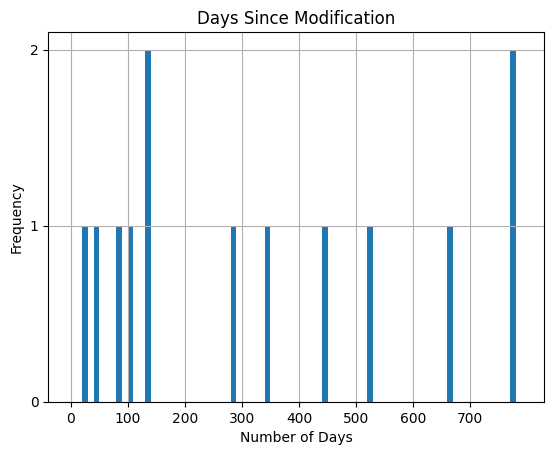

In [205]:
# Combining datasets/sheets on common Plan ID (Source and Impl)

source_impl_join =pd.merge(df1, df2, on='Plan ID', how='inner')
source_impl_join.head()
source_impl_join['crt_end_diff'] = source_impl_join['End Date'].dt.date - source_impl_join['Created'].dt.date # New
# feature that calulates the days passed between ending and creation of a plan
source_impl_join['crt_end_diff'].dt.days.hist(bins=range(0, 800, 10))
plt.xticks(range(0, 800, 100))
plt.yticks(range(0, 3, 1))
plt.title('Days Since Modification')
plt.xlabel('Number of Days')
plt.ylabel('Frequency')

# Plot is sparse due to many missing values for End Date
source_impl_join.info()

,index,CurrentStatus
0,Interview Complete,94
1,Needs Interview,33


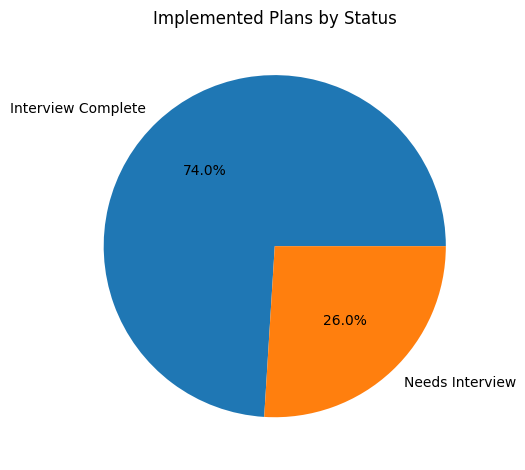

In [206]:
# Checking the current status of plans being monitored

##
current_status_counts_2 = pd.DataFrame(source_impl_join['CurrentStatus'].value_counts().reset_index()) # Creating separate df for plotting
display(current_status_counts_2)
plt.pie(data=current_status_counts_2, x='CurrentStatus', labels='index', autopct='%.1f%%')
plt.title('Implemented Plans by Status')
plt.tight_layout()
 
# We notice that the vast majority of the interviews for implemented plans is complete

## ➢ Visualizing Third Sheet/Dataset 

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
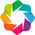

:Sankey   [Interval,Status]   (Counts)

In [207]:
# Alluvial flow diagram for Interval and Status

import holoviews as hv
hv.extension('bokeh')

df3_alluvial = df3.iloc[:,[2, 3, 6]] # Need to subset for visualization
df3_alluvial.head()
df3_alluvial = df3_alluvial.apply(lambda x: x.fillna(x.value_counts().index[0])) # Filling missing values
alluvial_df = pd.DataFrame(df3_alluvial['Status'].groupby(df3_alluvial['Interval']).value_counts())
alluvial_df.columns = ['Counts']
alluvial_df = alluvial_df.reset_index()
hv.Sankey(alluvial_df)

# Most monthly interval mitigations are being monitored, whereas almost all daily and weekly interval mitigations 
# are pending

<class 'pandas.core.frame.DataFrame'>
Int64Index: 391 entries, 0 to 390
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype              
---  ------             --------------  -----              
 0   SN                 391 non-null    int64              
 1   Plan ID            391 non-null    int64              
 2   Source Type        391 non-null    object             
 3   Channels_x         387 non-null    object             
 4   Status_x           391 non-null    object             
 5   End Date           138 non-null    datetime64[ns, UTC]
 6   Created By         391 non-null    object             
 7   Responsible 1      137 non-null    object             
 8   Responsible 2      3 non-null      object             
 9   Mitigation Type    133 non-null    object             
 10  Channels_y         387 non-null    object             
 11  Status_y           387 non-null    object             
 12  Interval           387 non-null    object         

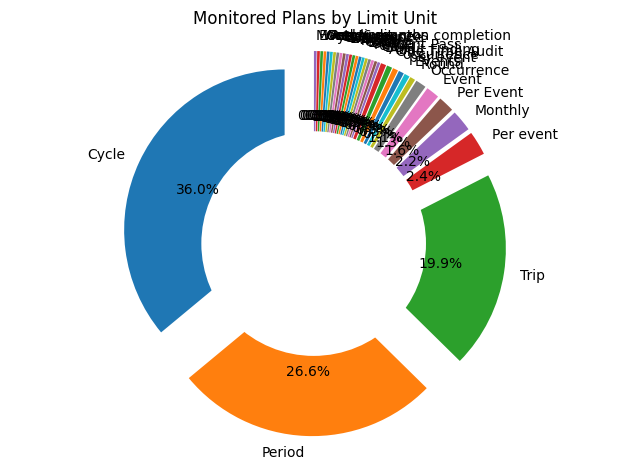

In [208]:
# Combining datasets/sheets on common Plan ID (Impl and Monitoring)

impl_monitoring_join =pd.merge(df2, df3, on='Plan ID', how='inner')
impl_monitoring_join.info() # Looks like only 391 mitigation plans are being monitored
impl_monitoring_join = impl_monitoring_join.drop('SN', 1) # Dropping SN column since data is already indexed

# Visualizing the distribution of Limit Unit

fig1, ax1 = plt.subplots()
explode = []
for i in range(len(limit_units_counts)):
    explode.append(.2)
    
ax1.pie(limit_units_counts['Limit Unit'], labels=limit_units_counts['index'], autopct='%1.1f%%', startangle=90,
       explode = explode)
centre_circle = plt.Circle((0,0),0.70,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
ax1.axis('equal') 
plt.title('Monitored Plans by Limit Unit')
plt.tight_layout()
plt.show()

# There appears to be many types of limit units which can be possibly consolidated to a single type